In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/100-images-of-top-50-car-brands/companies.csv
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_049.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_014.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_006.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_087.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_027.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_008.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_086.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_047.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_015.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_028.jpg
/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs/Nissan/Nissan_063.jpg
/kaggle/input/100-images-of-top-50-car

In [5]:
#importing all the different libraries that we are required to be Processing Deep Learning Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import keras
from keras import models, layers
import gc
import itertools
from collections import Counter 
from sklearn.metrics import (  # Import various metrics from scikit-learn
    accuracy_score,  # For calculating accuracy
    roc_auc_score,  # For ROC AUC score
    confusion_matrix,  # For confusion matrix
    classification_report,  # For classification report
    f1_score  # For F1 score
)



In [6]:
#code for ignoring little warning during the execution
import warnings  # Import the 'warnings' module for handling warnings
warnings.filterwarnings("ignore")

In [7]:

from PIL import ImageFile

# Enable the option to load truncated images.
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [8]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten

from tensorflow.keras.models import Model

#here we are using the resnet model for the classification
from tensorflow.keras.applications.resnet50 import ResNet50

from tensorflow.keras.applications.resnet50 import preprocess_input

from tensorflow.keras.preprocessing import image

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img

from tensorflow.keras.models import Sequential

import numpy as np

from glob import glob

import matplotlib.pyplot as plt



In [9]:
pip install tensorflow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 22.9 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: keras
    Found existing installation: keras 3.0.5
    Uninstalling keras-3.0.5:
      Successfully uninstalled keras-3.0.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
Note: you may need to restart the kernel to use updated packages.


In [10]:
dataset='/kaggle/input/100-images-of-top-50-car-brands/imgs_zip'

In [11]:
#re-size all the images to a particular format

IMAGE_SIZE = [224,224]
#here 224,224 is the width and the height.


In [12]:
from tensorflow.keras.applications import ResNet50

# Assuming IMAGE_SIZE is defined earlier in your code
resnet = ResNet50(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)
#as the resnet will give you 1000 of categories of the answer. but we oly
#want 3 out of them , so we have take include_top=False.


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [13]:
resnet.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [14]:
for layer in resnet.layers:
    layer.tarinable = False #as we are not training the images.

In [15]:
dataset

'/kaggle/input/100-images-of-top-50-car-brands/imgs_zip'

In [16]:
from glob import glob

# Use the correct path with a wildcard to list all folders
folders = glob('/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs')


In [17]:
folders

['/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs']

In [18]:
pip install pillow


Note: you may need to restart the kernel to use updated packages.


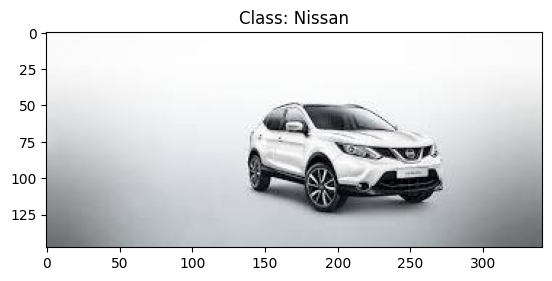

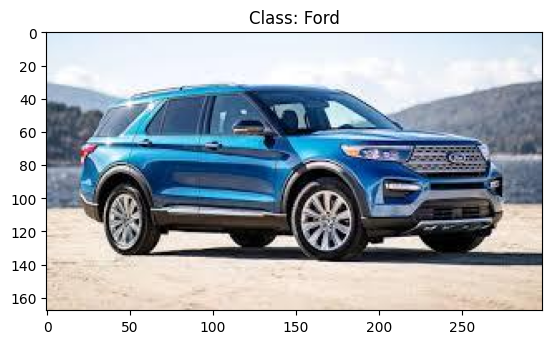

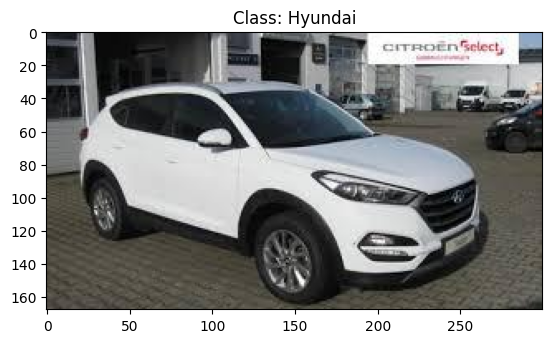

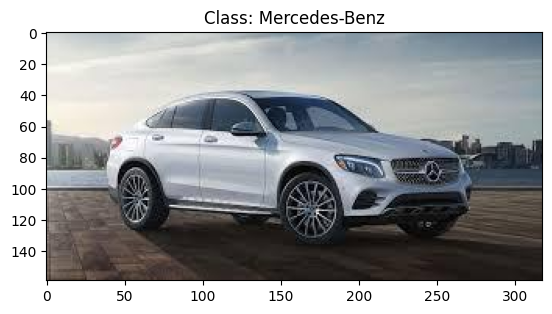

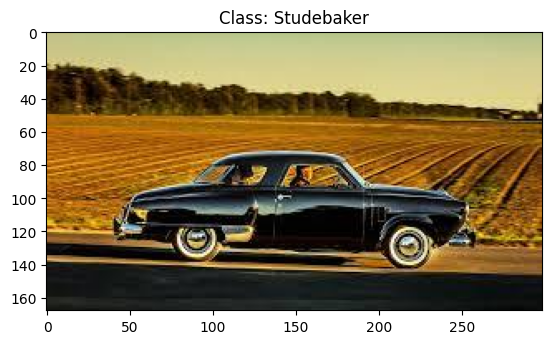

...

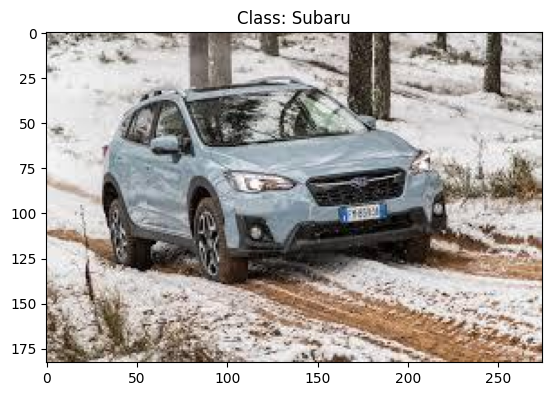

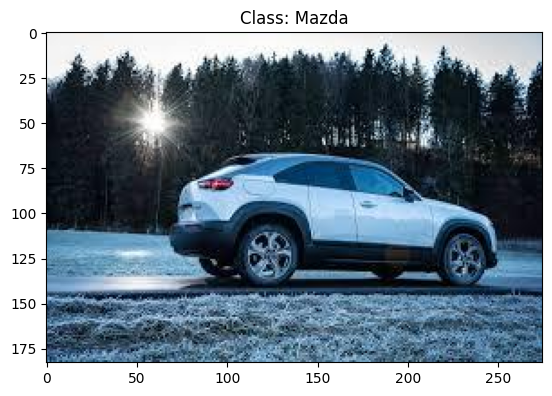

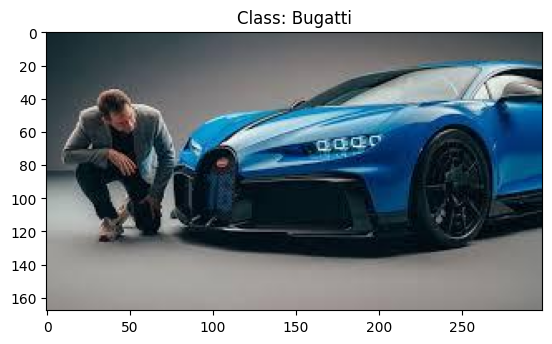

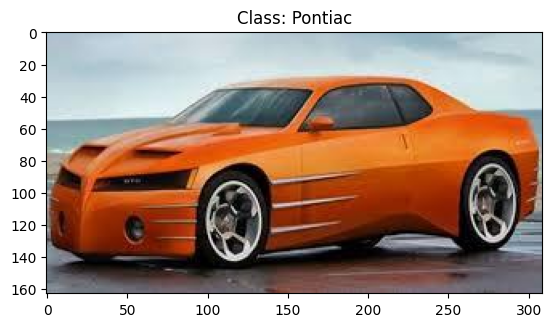

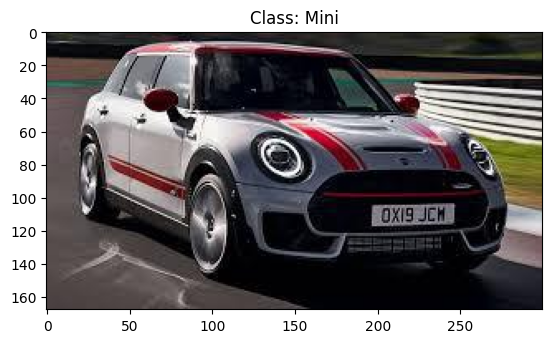

In [19]:
import os
from PIL import Image
import matplotlib.pyplot as plt

#just specify the folder which contain root directory
root_folder = '/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs'

# list of each sub directory folder in the dataset
class_folders = [folder for folder in os.listdir(root_folder) if os.path.isdir(os.path.join(root_folder, folder))]

# Loop through each class folder and print one image
for class_folder in class_folders:
    class_path = os.path.join(root_folder, class_folder)
    image_files = [file for file in os.listdir(class_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if len(image_files) > 0:
        # Take the first image in the folder
        image_path = os.path.join(class_path, image_files[0])

        # Display the image
        img = Image.open(image_path)
        plt.imshow(img)
        plt.title(f'Class: {class_folder}')
        plt.show()
    else:
        print(f"No images found in {class_folder} folder.")


In [20]:
output_folder = '/kaggle/working/'

In [21]:
output_folder

'/kaggle/working/'

In [22]:
from PIL import Image
import os

# Specify the root folder containing subdirectories (each subdirectory is a class in your dataset)
root_folder = '/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs'
output_folder = '/kaggle/working/'
#getting list of each folder
class_folders = [folder for folder in os.listdir(root_folder) if os.path.isdir(os.path.join(root_folder, folder))]

#loop through each folder image for the resizing purpose
for class_folder in class_folders:
    class_path = os.path.join(root_folder, class_folder)
    output_class_path = os.path.join(output_folder, class_folder)

    # Create the output class folder if it doesn't exist
    os.makedirs(output_class_path, exist_ok=True)

    image_files = [file for file in os.listdir(class_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for image_file in image_files:
        # path to input img
        input_image_path = os.path.join(class_path, image_file)

        # path to output img
        output_image_path = os.path.join(output_class_path, image_file)

        # Open the image using Pillow
        img = Image.open(input_image_path)

        # Resize the image to (224, 224)
        resized_img = img.resize((224, 224))

        # Save the resized image
        resized_img.save(output_image_path)


In [23]:

class_folders = [folder for folder in os.listdir(root_folder) if os.path.isdir(os.path.join(root_folder, folder))]

# Print the names of all folders
for class_folder in class_folders:
    print(class_folder)

Nissan
Ford
Hyundai
Mercedes-Benz
Studebaker
Chrysler
GMC
Lincoln
Alfa Romeo
Fiat
Aston Martin
Volkswagen
Land Rover
Oldsmobile
Buick
Honda
Dodge
Porsche
Peugeot
Saab
Kia
Toyota
Suzuki
Maserati
Citroen
Jeep
Volvo
Mitsubishi
Cadillac
Chevrolet
Daewoo
Tesla
Jaguar
MG
Bentley
Renault
Ferrari
Hudson
BMW
Lexus
Audi
Ram Trucks
Infiniti
Acura
Genesis
Subaru
Mazda
Bugatti
Pontiac
Mini


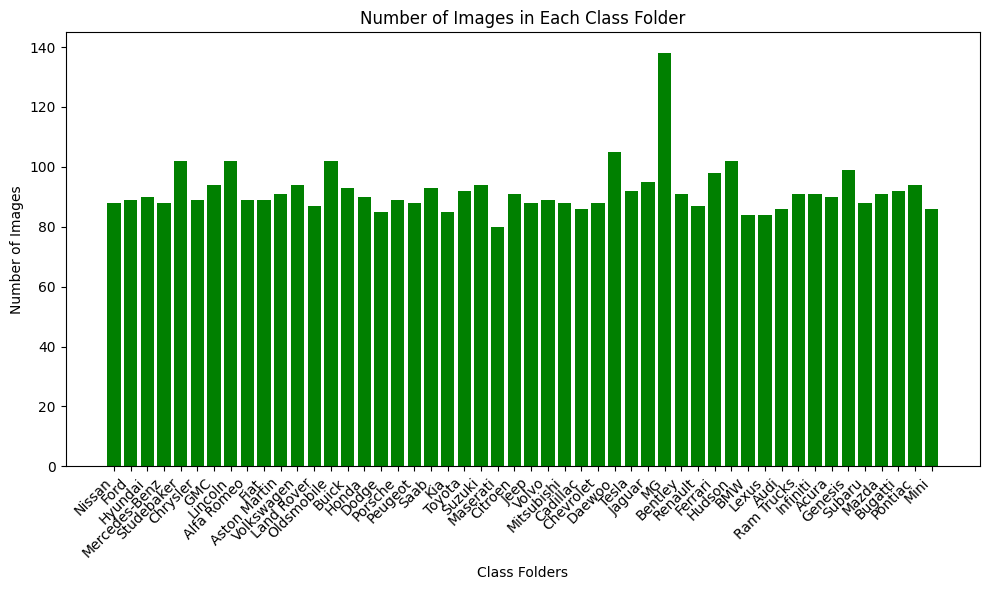

In [1]:

import os
import matplotlib.pyplot as plt


root_folder = '/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs'


class_folders = [folder for folder in os.listdir(root_folder) if os.path.isdir(os.path.join(root_folder, folder))]

# Count the number of images in each class folder
class_counts = {class_folder: len(os.listdir(os.path.join(root_folder, class_folder))) for class_folder in class_folders}

# Plot the bar graph
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='green')
plt.xlabel('Class Folders')
plt.ylabel('Number of Images')
plt.title('Number of Images in Each Class Folder')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()

# Show the plot
plt.show()


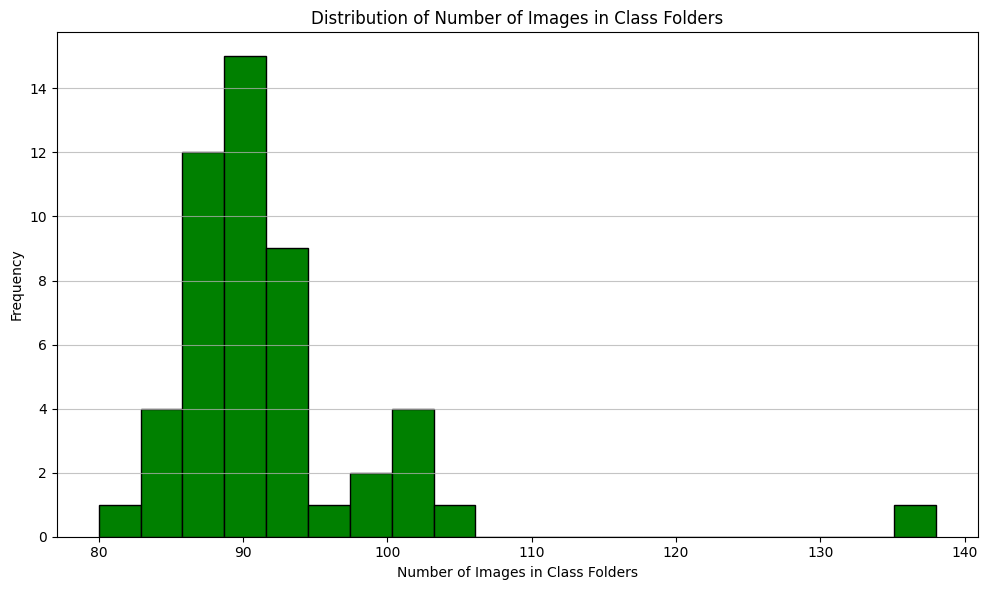

In [3]:
import os
import matplotlib.pyplot as plt

root_folder = '/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs'

class_folders = [folder for folder in os.listdir(root_folder) if os.path.isdir(os.path.join(root_folder, folder))]

# Count the number of images in each class folder
class_counts = [len(os.listdir(os.path.join(root_folder, class_folder))) for class_folder in class_folders]

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(class_counts, bins=20, color='green', edgecolor='black')
plt.xlabel('Number of Images in Class Folders')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Images in Class Folders')
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()

# Show the plot
plt.show()


In [26]:
# Assuming you are using TensorFlow and Keras
from tensorflow.keras.layers import Flatten

x = Flatten()(resnet.output)


In [27]:
len(class_folders)

50

In [48]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense


# Add a Dense layer for prediction
x = Dense(len(class_folders), activation='softmax')(x)

# Create a model object
model = Model(inputs=resnet.input, outputs=x)


In [49]:
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,690,162 (90.37 MB)

 Trainable params: 23,637,042 (90.17 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from keras.utils import to_categorical  # Use keras.utils instead of tensorflow.keras.utils

root_folder = '/kaggle/input/100-images-of-top-50-car-brands/imgs_zip/imgs'

class_folders = [folder for folder in os.listdir(root_folder) if os.path.isdir(os.path.join(root_folder, folder))]

#  Load ResNet50 model without top layers (include_top=False)
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add Global Average Pooling layer to reduce the spatial dimensions
x = GlobalAveragePooling2D()(resnet_model.output)
resnet_features_model = Model(inputs=resnet_model.input, outputs=x)

#  Load images and extract features
all_features = []
all_labels = []

for class_index, class_folder in enumerate(class_folders):
    class_path = os.path.join(root_folder, class_folder)
    for filename in os.listdir(class_path):
        img_path = os.path.join(class_path, filename)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img)
        img_array = preprocess_input(img_array)
        
        # Extract features using the pre-trained ResNet model
        features = resnet_features_model.predict(np.expand_dims(img_array, axis=0))
        
        all_features.append(features.flatten())
        all_labels.append(class_index)

# Convert lists to NumPy arrays
X = np.array(all_features)
y = np.array(all_labels)

# Convert labels to one-hot encoding
y = to_categorical(y, num_classes=len(class_folders))

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━